In [ ]:
!unzip "/content/drive/MyDrive/dog-breed-identification.zip"

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

In [ ]:
import pandas as pd
df = pd.read_csv("/content/labels.csv")
print(df.head())
print(df.describe())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


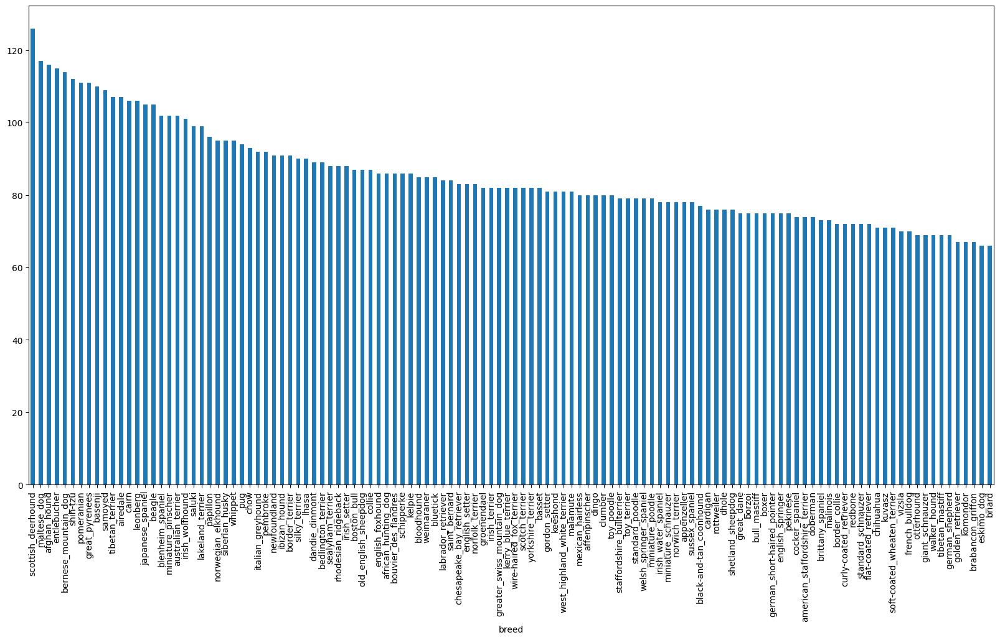

In [ ]:
df["breed"].value_counts().plot.bar(figsize = (20,10));

In [ ]:
df["breed"].value_counts().median()  ## the middle number of the whole data set  --> this means that the number of sample for  per breed is aproxx of this value

82.0

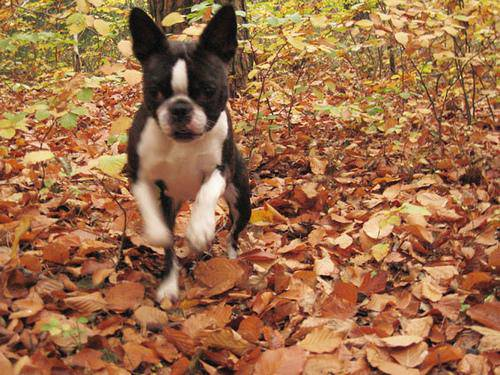

In [ ]:
from IPython.display import Image
Image("/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
## We Need PathNames form image id's
filenames  = [ "/content/train/"+fname + ".jpg" for fname in df["id"]]
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
## checkign weather the file is equal to the actual import dataset

import os
if len(os.listdir("/content/train/")) == len(filenames):
  print("Filename Matches actual data size ")
else :
  print("Please check the working directory ")

Filename Matches actual data size 


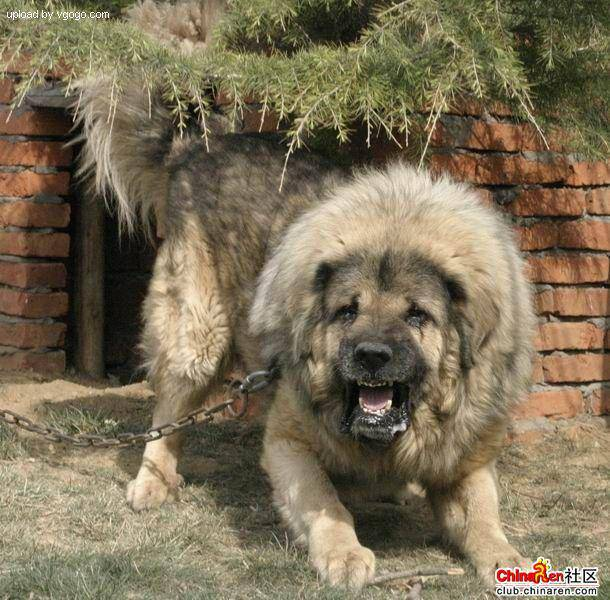

In [ ]:
Image(filenames[9000])

In [ ]:
df["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = df["breed"]
labels.head()
## we need to start converting these labels into numbers
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
## checking the length of the labels
len(labels)

10222

In [ ]:
 if len(labels) == len(filenames):
  print("Number of labels Match  number of filenames")
else :
  print("Please Check the FileNames")

Number of labels Match  number of filenames


In [ ]:
## we need to find unique labels or values in the Array
un_v = np.unique(labels)
un_v

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(un_v) ## there are a 120 unique values of dog we are trying to find or figure out herw


120

In [ ]:
## now we will be converting every Label into a boolean label
bool_label = [label == un_v for label  in labels ]
bool_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(bool_label)

10222

In [ ]:
print(labels[0])
print(np.where(un_v == labels[0])) ## this will print where the index is occuring
print(bool_label[0].argmax())
print(bool_label[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(bool_label[1].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
## Now Creating a Traning set and valadition set to train our data
x = filenames
y = bool_label

In [ ]:
NUM_IMAGES = 1000 #@param {type :"slider" , min :1000 , max : 10000 , step :100}

In [ ]:
from sklearn.model_selection import train_test_split
# spliting our data into traning and valadating sets
X_train , X_val , Y_train , Y_val  = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size = 0.2 , random_state = 42 )
len(X_train) , len(X_val) , len(Y_train) , len(Y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2] , Y_train[:2]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False

In [ ]:
import tensorflow as tf
## Now we will be converting our Images into Numbers or Tensors
def processing_img (filepath) :
  image_path = 'filepath'


In [ ]:
img_size = 224
def process_image (image_path , img_size = img_size):
  " " "  Takes an image file path and truns the image into a Tensor . """
  image  = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image , channels = 3 )
  # converting  the colour channel value from 0 to 225 to 0 to 1
  image = tf.image.convert_image_dtype(image , tf.float32)
  # resizing the image
  image = tf.image.resize(image , size = [img_size , img_size])

  return image


In [ ]:
## Now we will turn our data into batches
## Creating a Function to convert the label and the image into a tuple to return it to the batch so that we can pass them one ny one
def get_img_label(image_path , label)  :
  image = process_image(image_path)
  return image , label

In [ ]:
get_img_label(x[42] , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
## Creating the Batch Function
BATCH_SIZE = 32
def create_data_batches(X , y = None , batch_size = BATCH_SIZE , valid_data = False , test_data = False ):
  """ Creates a Batches of data  out of image (x)  and label (Y) pairs
  it shuffels the data if it's traning data  but doesn't shuffels the data if it's validation data
  also accepts Test Data as Input (with no labels)"""
  # if Test data doesn't have labels on them
  if test_data :
    print("Creating  test data batches.... ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # --> this is only file paths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

 # If the data batch is a Validation data
  elif valid_data :
    print("Creating Validation Data batches....")
    data =  tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  # Now if the Data batch is a Traning data batch

  else :
    print("Creating Traning DataBatches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # as it is a test data batch we would like to shuffle it
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_img_label)

    # creating a tuple with image and it's label
    data_batch = data.batch(BATCH_SIZE)


  return data_batch



In [ ]:
# prompt: using the function above can you generate two data batches one of a traning set and one of validation set

train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)


Creating Traning DataBatches....
Creating Validation Data batches....


In [ ]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Creating a Function to display images at time
import matplotlib.pyplot as plt

def show_25_images(images , labels):
  plt.figure(figsize=(10,10))
  for i in range (25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(un_v[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())


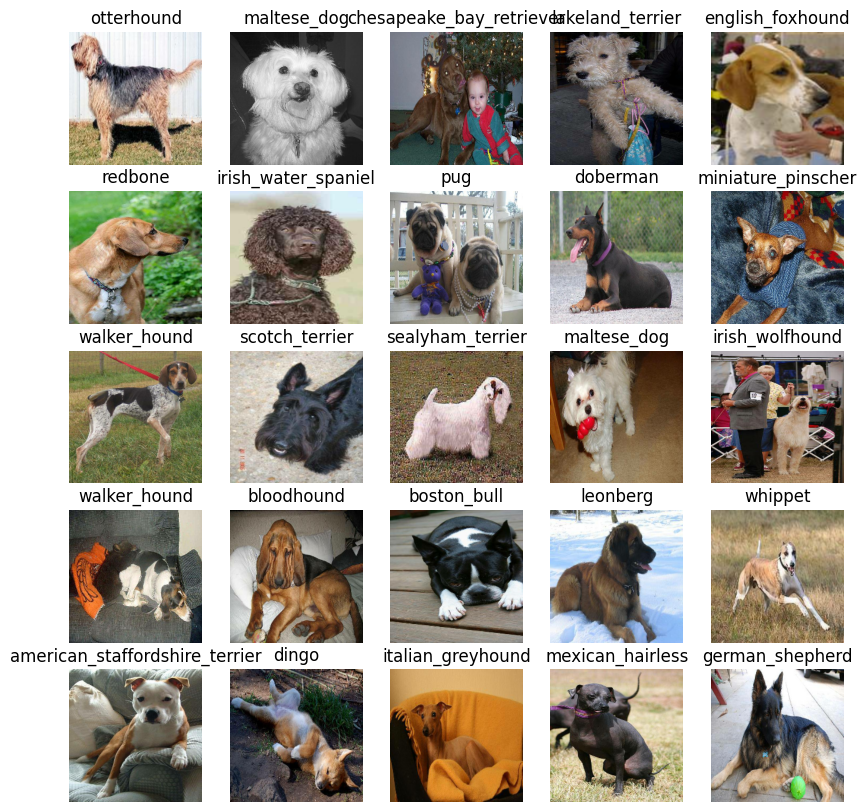

In [ ]:
show_25_images(train_images , train_labels)

In [ ]:
  train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
input_shape = [None , img_size , img_size , 3] # batch , Height , Width , ColourChannel
output_shape = len(un_v)

# Setup Model URL from TensorFlow Hub
model_url = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, models
import tf_keras as keras

# Defining a function to build a Keras model
def create_model(i_s = input_shape, o_s = output_shape, m_u = model_url):
    print("Building a model with", model_url)

    # Setting up the model layers
    model =keras.Sequential([
        hub.KerasLayer(model_url),keras.layers.Dense(units= output_shape , activation = "softmax")
    ])

    # Compiling the model
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(),
        optimizer=keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    # building the model
    model.build(input_shape)

    return model





In [ ]:
model = create_model()

model.summary()


Building a model with https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
def create_logs () :
  # creating a log directory
  logdir = os.path.join("/content/drive/MyDrive/logs" , datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stop = keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

In [ ]:
NUM_EPOCH = 100 # @param {type :"slider" , min : 10 , max : 100}

In [ ]:
print("GPU avaliable " if   tf.config.list_physical_devices else "not avliable ")

GPU avaliable 


In [ ]:
def train_model () :
  model = create_model()
  tensorboard = create_logs()
  # fiting the model
  model.fit(x = train_data  , epochs = NUM_EPOCH , validation_data = val_data,
            validation_freq = 1, callbacks  = [tensorboard ,early_stop])

  return model

In [ ]:
model = train_model()

Building a model with https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 10s 128ms/step - loss: 4.5893 - accuracy: 0.0850 - val_loss: 3.3916 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 2s 90ms/step - loss: 1.6147 - accuracy: 0.6975 - val_loss: 2.1860 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 2s 69ms/step - loss: 0.5433 - accuracy: 0.9513 - val_loss: 1.7012 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 2s 77ms/step - loss: 0.2415 - accuracy: 0.9875 - val_loss: 1.4942 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 2s 77ms/step - loss: 0.1416 - accuracy: 0.9975 - val_loss: 1.4201 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 2s 85ms/step - loss: 0.0971 - accuracy: 0.9987 - val_loss: 1.3796 - val_accuracy: 0.6350
Epoch 7/100
25/25 [======================

In [ ]:
print("done with building the models")

done with building the models


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/logs

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predections = model.predict(val_data , verbose = 1)

7/7 [==============================] - 4s 91ms/step


In [ ]:
predections[0]

array([1.11523760e-03, 8.28864722e-05, 2.95998354e-04, 7.95510656e-04,
       3.28287279e-04, 2.99766689e-04, 3.00599765e-02, 1.59975825e-04,
       4.57859569e-05, 5.48789802e-04, 4.23160905e-04, 2.08208527e-04,
       1.46396633e-04, 4.49206818e-05, 1.50246124e-04, 1.34034676e-03,
       1.36725663e-04, 1.55885458e-01, 5.31177066e-05, 1.11980502e-04,
       7.10660999e-04, 5.83880392e-05, 2.09409209e-05, 1.43945310e-03,
       6.09204326e-05, 5.02137525e-04, 1.02063216e-01, 5.56824889e-05,
       5.95489866e-04, 1.42511359e-04, 6.39966456e-05, 6.41554082e-03,
       7.17651157e-04, 8.28889642e-06, 8.01032584e-05, 1.15314610e-01,
       4.80507733e-05, 1.61244679e-04, 5.78063373e-05, 3.58878606e-04,
       1.81754061e-04, 2.91556098e-05, 1.32158981e-04, 1.70839368e-04,
       8.01747956e-06, 2.56854342e-04, 6.76753989e-05, 6.23684202e-04,
       3.25207046e-04, 7.53304339e-04, 5.09723614e-04, 9.59446334e-05,
       1.86205178e-03, 3.25276633e-05, 1.13803493e-04, 5.77413193e-05,
      

In [ ]:
np.sum(predections[0])

1.0

In [ ]:
index = 56
print(f"Max value (probablity of perdection ) {np.max(predections[index])}")
print(f"Max Index  {np.argmax(predections[index]) } ")
print(f"predicted label : {un_v[np.argmax(predections[index])]}")

Max value (probablity of perdection ) 0.7994611263275146
Max Index  17 
predicted label : border_terrier


In [ ]:
def get_pred_label(predection_probablity) :
  return un_v[np.argmax(predection_probablity)]


In [ ]:
pred_label = get_pred_label(predections[10])

In [ ]:
pred_label

'yorkshire_terrier'

In [ ]:
def unbatchify(data) :
  """ takes a batched dataset of (image , label ) Tensors and returns seperate array of images and labels . """
  images = []
  labels = []
  for image , label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(un_v[np.argmax(label)])
  return images , labels



In [ ]:
val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]




(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels[0])

'affenpinscher'

In [ ]:
import matplotlib.pyplot as plt

def plot_pred(predection_probablities , labels , images , n =1 ) :
  """ View the predection , ground Truth , and the image of the predection """
  pred_prob , true_label , image = predection_probablities[n] , labels[n] , images[n]
  pred_label = get_pred_label(pred_prob)
  # plot image and Display the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # chainging the colour based on the predections
  if pred_label == true_label:
    color = "green"
  else :
    color = "red"
  # mentoning the plot title
  plt.title("{} {:2.0f}% {}".format(pred_label , np.max(pred_prob)*100 , true_label ) , color = color )



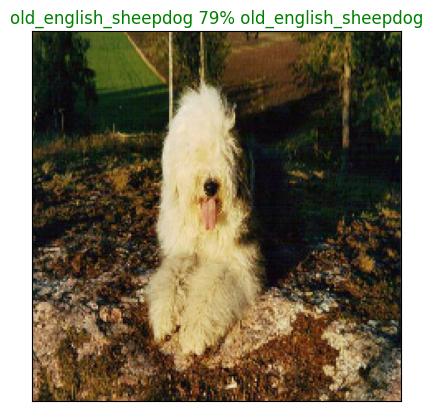

In [ ]:
plot_pred(predection_probablities=predections , labels = val_labels , images = val_images , n = 7)

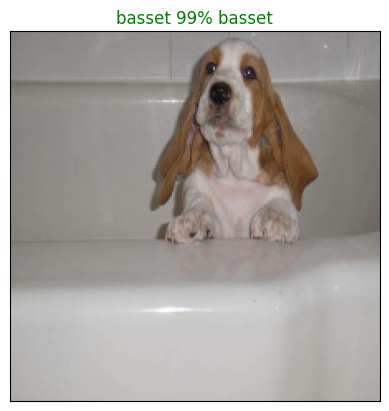

In [ ]:
plot_pred(predection_probablities=predections , labels = val_labels , images = val_images , n = 2)

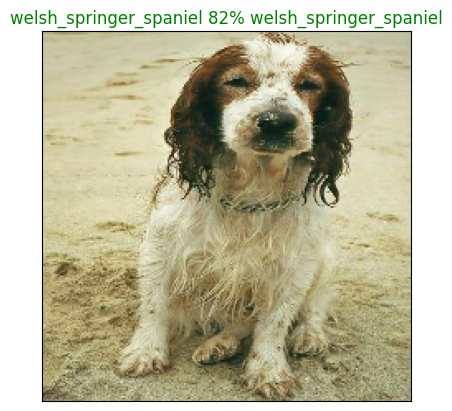

In [ ]:
plot_pred(predection_probablities=predections , labels = val_labels , images = val_images , n = 24)  # --> predicted label is correct as the true label the machine has gussed it right

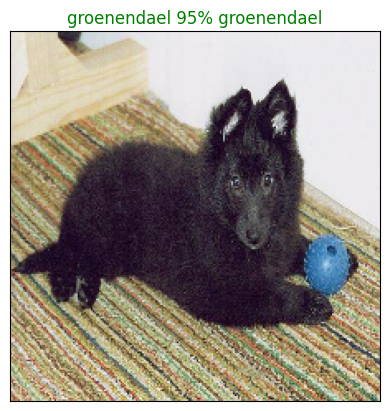

In [ ]:
plot_pred(predection_probablities=predections , labels = val_labels , images = val_images , n = 77)

In [ ]:
# now we are checing the top 10 predections made by the model
def plot_pred_conf(predection_probablities , labels , n = 1) :
  pred_prob , true_label = predection_probablities[n] , labels[n]
  # getting the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the indices of the top 10 predictions
  top_10_index = np.argsort(pred_prob)[::-1][:10] #Get the indices that would sort the array, reverse it and get the top 10

  top_10_values = pred_prob[top_10_index]
  # getting the predction labels
  top_10_labels = un_v[top_10_index]

  # now ploting ht gicen values
  top_plot = plt.bar(np.arange(len(top_10_labels)), top_10_values , color = "grey")

  plt.xticks(np.arange(len(top_10_labels)), labels = top_10_labels , rotation = "vertical" )


  if np.isin(true_label , top_10_labels) :
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")

  else :
    pass


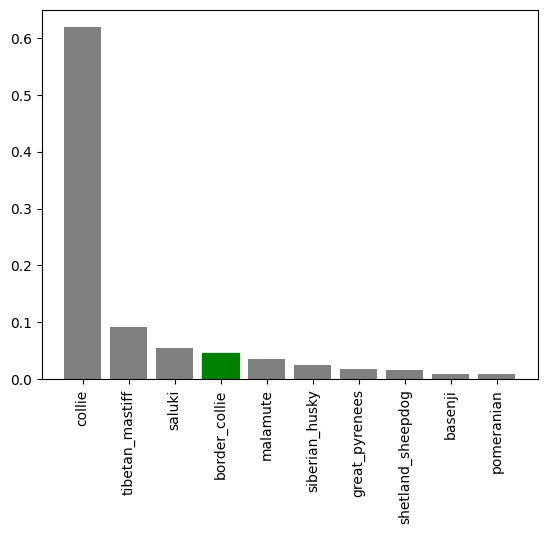

In [ ]:
plot_pred_conf(predection_probablities= predections , labels = val_labels , n =9)

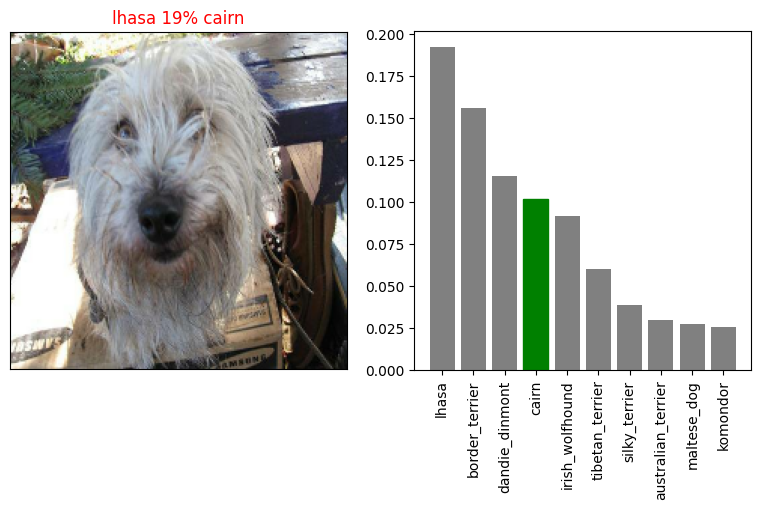

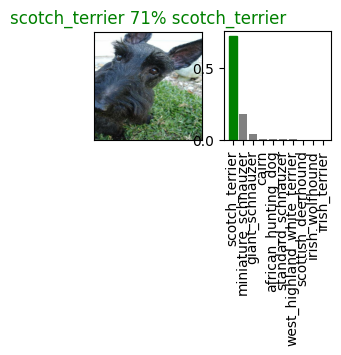

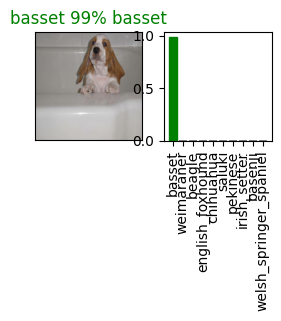

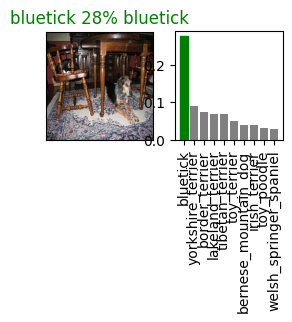

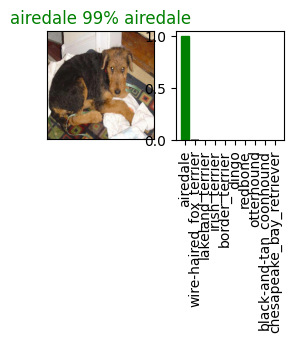

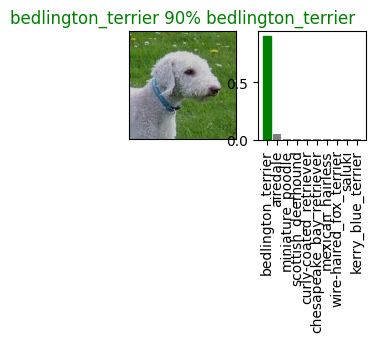

In [ ]:
# checking predections and it's values
# checking predections and it's values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols , 5*num_rows )) #figsize is an attribute of figure, not a standalone function
for i in range(num_images) :
  plt.subplot(num_rows , 2*num_cols ,  2*i+1)
  plot_pred(predection_probablities = predections
               ,labels = val_labels , images = val_images ,  n = i + i_multiplier )
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(predection_probablities = predections , labels = val_labels , n= i+i_multiplier )
  plt.show()

In [ ]:
# now we will be saivng a model and reloading the model

In [ ]:
def save_model(model , suffix = None) :
  modeldir = os.path.join("/content/drive/MyDrive/Models" , datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # h5 is the saving format of the model
  print("Saving the Model now ")
  model.save(model_path)
  return model_path

In [ ]:
# making a function to load a trained model
def load_model (model_path) :
  print("loading the saved model")
  # Use keras.models instead of keras.model
  model =  keras.models.load_model(model_path , custom_objects = {"KerasLayer" : hub.KerasLayer}) # Fix typo in custom_objects
  return model # Add return statement to return loaded model

In [ ]:
save_model(model, suffix = "Adam Optimiser with 1000 images ")

Saving the Model now 


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Models/20240925-17011727283692-Adam Optimiser with 1000 images .h5'

In [ ]:
image_model_laoder = load_model(model_path="/content/drive/MyDrive/Models/20240921-19301726947002-1000 images Adam.h5")

loading the saved model


In [ ]:
# checking the value of the both made model and loaded model
model.evaluate(val_data)

7/7 [==============================] - 0s 53ms/step - loss: 1.2548 - accuracy: 0.6700


[1.2548352479934692, 0.6700000166893005]

In [ ]:
image_model_laoder.evaluate(val_data) # for some reason this time it is Loosing score

7/7 [==============================] - 1s 50ms/step - loss: 1.4058 - accuracy: 0.5950


[1.4058175086975098, 0.5950000286102295]

In [ ]:
# now traning a model on a full dataset
full_data = create_data_batches(x,y)

Creating Traning DataBatches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building a model with https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor= "accuracy" , patience = 3)

In [ ]:
# fiting the model
full_model.fit(x=full_data , epochs = 100 , callbacks =[full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 29s 80ms/step - loss: 1.3529 - accuracy: 0.6667
Epoch 2/100
320/320 [==============================] - 22s 68ms/step - loss: 0.4039 - accuracy: 0.8796
Epoch 3/100
320/320 [==============================] - 20s 64ms/step - loss: 0.2390 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 21s 64ms/step - loss: 0.1554 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 20s 64ms/step - loss: 0.1079 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 21s 66ms/step - loss: 0.0781 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 21s 66ms/step - loss: 0.0597 - accuracy: 0.9901
Epoch 8/100
320/320 [==============================] - 21s 64ms/step - loss: 0.0458 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 21s 64ms/step - loss: 0.0379 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 21s 65ms/step - l

In [ ]:
save_model(full_model , suffix = "full-image-set trianed-on AdamOptmiser" )

Saving the Model now 


'/content/drive/MyDrive/Models/20240925-17101727284206-full-image-set trianed-on AdamOptmiser.h5'

In [ ]:
load_full_model = load_model("/content/drive/MyDrive/Models/20240923-08091727078994-full-image-set trianed-on AdamOptmiser.h5")

loading the saved model


In [ ]:
load_full_model.evaluate(full_data)

320/320 [==============================] - 21s 64ms/step - loss: 0.0074 - accuracy: 0.9993


[0.007385435048490763, 0.9993152022361755]

In [ ]:
full_path = "/content/drive/MyDrive/test.zip/"
test_filenames = [full_path + fname for fname in os.listdir(full_path)]
test_filenames[:10]


['/content/drive/MyDrive/test.zip/c8f26ded10708ab8def121c3f5dbddc2.jpg',
 '/content/drive/MyDrive/test.zip/c9501fe1f07bc43eeedb593aaebb3226.jpg',
 '/content/drive/MyDrive/test.zip/c8f7a7f9999d3e2da83529c0185b9e73.jpg',
 '/content/drive/MyDrive/test.zip/c94cb08d0725ef8fe7647266def87b35.jpg',
 '/content/drive/MyDrive/test.zip/c81fe76409bf415be751bae1190af3e5.jpg',
 '/content/drive/MyDrive/test.zip/c7f7c57c5e9b784cd0e202defe88d72d.jpg',
 '/content/drive/MyDrive/test.zip/c887d85c607389f8009b7a28143a5674.jpg',
 '/content/drive/MyDrive/test.zip/c812195a6d15bbc6e85d412da3f777f5.jpg',
 '/content/drive/MyDrive/test.zip/c938b6c07225110028d07e01d731ce21.jpg',
 '/content/drive/MyDrive/test.zip/c91ffde2f26b1b7a77460001546795a3.jpg']

In [ ]:
full_data_batch = create_data_batches(test_filenames , test_data = True)

Creating  test data batches.... 


In [ ]:
len(test_filenames)

7653

In [ ]:
full_data_batch

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predections = load_full_model.predict(full_data_batch , verbose =1)

240/240 [==============================] - 1376s 6s/step


In [ ]:
# saving the file in CSV format
np.savetxt("/content/drive/MyDrive/test_predections.csv" , test_predections , delimiter = ",")

In [ ]:
test_predections = np.loadtxt("/content/drive/MyDrive/test_predections.csv" , delimiter = ",")

In [ ]:
test_predections[:10]

array([[5.91718230e-09, 1.40063086e-10, 8.38246250e-10, ...,
        1.30586164e-08, 8.54631990e-11, 1.20933407e-07],
       [1.14727209e-06, 3.48470252e-07, 1.57211562e-05, ...,
        6.50806851e-06, 3.35825689e-07, 2.56375476e-11],
       [4.53262874e-05, 3.45412654e-09, 4.49786963e-09, ...,
        7.42824735e-09, 2.22876057e-04, 9.82955694e-01],
       ...,
       [1.21283881e-08, 1.46808607e-05, 1.06836502e-07, ...,
        3.30110306e-05, 3.89577326e-06, 2.63159859e-06],
       [8.33229430e-10, 6.96077751e-10, 3.03303715e-10, ...,
        5.90437878e-07, 4.99441038e-13, 1.68463576e-11],
       [1.81471279e-07, 6.69767601e-08, 4.44475762e-10, ...,
        1.30169042e-10, 1.28091401e-07, 1.27541222e-08]])

In [ ]:
test_predections.shape

(7653, 120)

In [ ]:
# working to make it in the submitable format
preds_df = pd.DataFrame(columns = ["id"] + list(un_v))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(full_path)]
test_ids[:10]
preds_df["id"] = test_ids
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c8f26ded10708ab8def121c3f5dbddc2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,c9501fe1f07bc43eeedb593aaebb3226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,c8f7a7f9999d3e2da83529c0185b9e73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,c94cb08d0725ef8fe7647266def87b35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,c81fe76409bf415be751bae1190af3e5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(un_v)] = test_predections
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c8f26ded10708ab8def121c3f5dbddc2,5.917182e-09,1.400631e-10,8.382463e-10,1.794279e-10,2.270148e-09,1.482666e-10,4.441179e-05,1.224804e-10,4.749419e-07,...,2.528660e-05,1.790411e-08,2.291505e-08,1.012706e-09,4.944714e-10,1.223382e-10,3.403214e-08,1.305862e-08,8.546320e-11,1.209334e-07
1,c9501fe1f07bc43eeedb593aaebb3226,1.147272e-06,3.484703e-07,1.572116e-05,1.394389e-08,3.718743e-04,3.571932e-09,9.491679e-06,1.902697e-05,7.754256e-01,...,1.500298e-08,2.601888e-08,2.326636e-07,3.131460e-06,9.730301e-07,4.703678e-07,1.181998e-06,6.508069e-06,3.358257e-07,2.563755e-11
2,c8f7a7f9999d3e2da83529c0185b9e73,4.532629e-05,3.454127e-09,4.497870e-09,4.469341e-07,4.713581e-06,4.940735e-07,9.237484e-05,4.253858e-05,2.644372e-06,...,7.544909e-07,1.278658e-04,6.752106e-08,1.160035e-08,1.448425e-07,1.400191e-04,2.517894e-03,7.428247e-09,2.228761e-04,9.829557e-01
3,c94cb08d0725ef8fe7647266def87b35,4.934681e-14,1.251487e-06,1.296318e-11,4.402090e-11,2.489618e-11,1.629789e-10,3.941534e-10,1.510414e-09,1.178512e-03,...,3.351425e-11,1.546837e-10,5.594389e-08,5.835499e-09,8.102691e-11,3.773663e-10,4.652876e-12,1.376513e-08,2.107290e-10,2.288354e-10
4,c81fe76409bf415be751bae1190af3e5,1.589858e-10,1.293108e-13,3.094181e-09,1.739480e-13,1.515742e-07,7.705943e-08,8.022902e-11,1.641523e-11,4.208371e-13,...,3.664985e-11,2.559390e-09,9.539965e-10,2.283357e-12,8.867912e-08,3.296606e-12,1.175975e-09,7.226619e-12,2.642025e-12,2.431311e-09


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/submission.csv" , index = False)